### Zadania

Celem zadań jest napisanie (fragmentów) programów, które wyodrębnią obiekty znajdujące się na podanych obrazach. Rozumie się przez to doprowadzenie obrazów do postaci binarnej z wyraźną separacją między obiektami a tłem oraz poszczególnymi obiektami.

Samo osiągnięcie "jakiegoś" wyniku ([`cv2.threshold`](https://docs.opencv.org/3.4/d7/d1b/group__imgproc__misc.html#gae8a4a146d1ca78c626a53577199e9c57) odpalone, próg wybrany "z palca", _coś tam_ widać, wynik wyświetlony) to co najwyżej połowa sukcesu (i oceny). Ważne jest pokazanie w drodze eksperymentu odpowiedzi na pytania - czy te podane w treści zadania, czy takie, które się Tobie nasunęły.

In [26]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

from numpy.lib.stride_tricks import sliding_window_view

In [3]:
# helper functions
def flood_fill(img: np.ndarray) -> np.ndarray:
    im_floodfill = img.copy()
    h, w = img.shape[:2]
    mask = np.zeros((h + 2, w + 2), np.uint8)
    cv2.floodFill(im_floodfill, mask, (0, 0), 255)
    im_floodfill_inv = cv2.bitwise_not(im_floodfill)
    im_out = img | im_floodfill_inv
    return im_out

##### Zad. 1: Monety szare

Dane są dwa czarno-białe obrazy monet, `monety_szare` oraz `monety_szare_szum`, z których drugi zawiera pewien poziom zakłóceń. Dokonaj binaryzacji tych obrazów za pomocą progowania.  
W jaki sposób ustalisz wartość progu? Jak wartość progu wpływa na wyniki?  
Jaki wpływ mają zakłócenia w drugim obrazie? Jak się ich pozbędziesz?

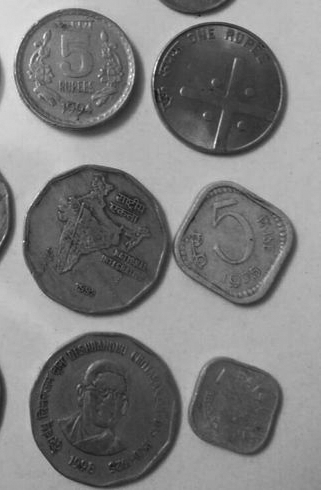

In [4]:
# 1A
monety_szare = cv2.imread("Monety_szare.bmp")
Image.fromarray(cv2.cvtColor(monety_szare, cv2.COLOR_BGR2RGB))

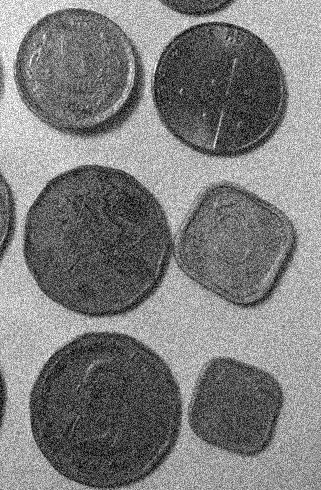

In [5]:
# 1B
monety_szare_szum = cv2.imread("Monety_szare_szum.bmp")
Image.fromarray(cv2.cvtColor(monety_szare_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 1A:

(490, 321, 3)

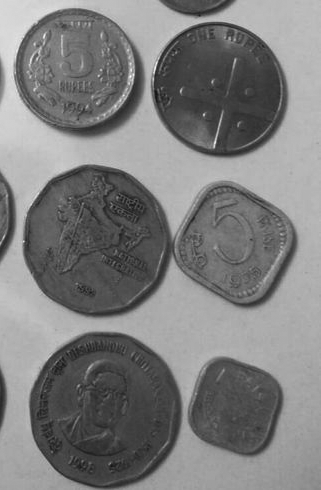

(157290,)

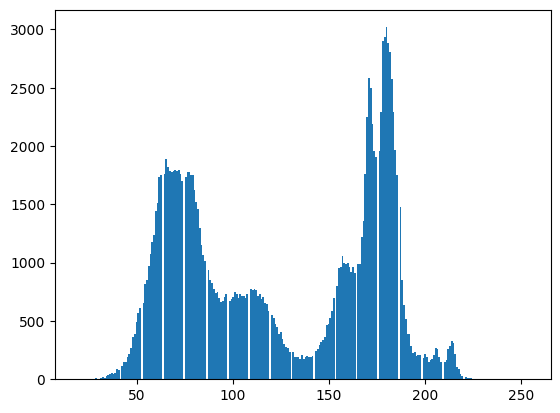

In [6]:
display(monety_szare.shape)
coin_gray_r = monety_szare[:, :, 0]

display(Image.fromarray(coin_gray_r))

display(coin_gray_r.flatten().shape)
_ = plt.hist(coin_gray_r.flatten(), bins=256)

thresholding with 80


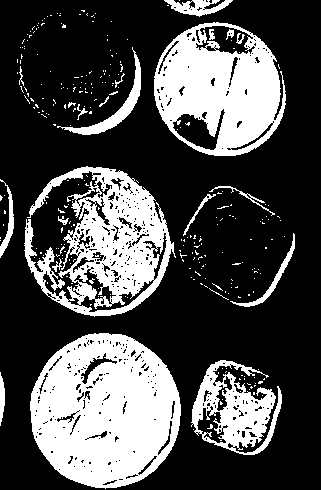

thresholding with 160


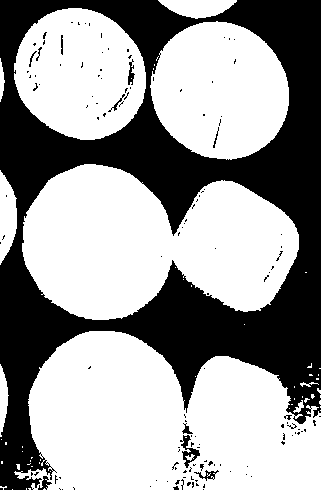

In [7]:
# simple thresholding
_, img_threshInv = cv2.threshold(coin_gray_r, 80, 255, cv2.THRESH_BINARY_INV)
print("thresholding with 80")
display(Image.fromarray(img_threshInv))

_, img_threshInv = cv2.threshold(coin_gray_r, 160, 255, cv2.THRESH_BINARY_INV)
Image.fromarray(img_threshInv)
print("thresholding with 160")
display(Image.fromarray(img_threshInv))

Edge-based segmentation

blurred image


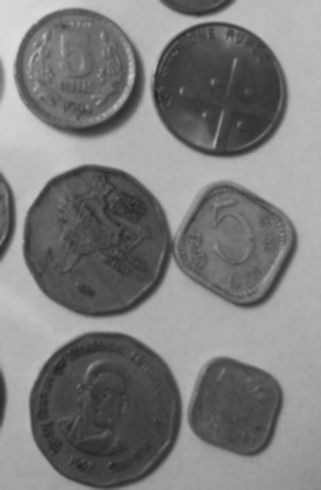

edges with Canny


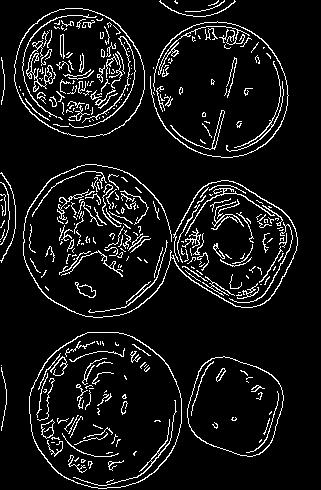

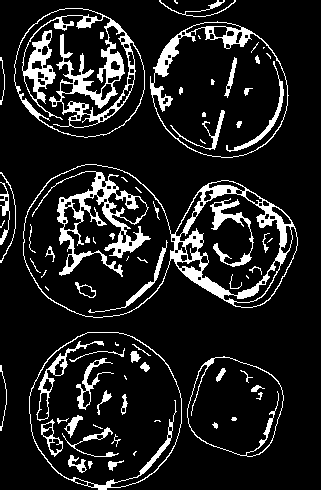

flood fill


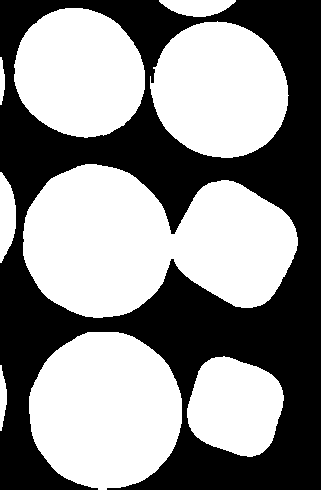

In [8]:
# blur image
img_blur = cv2.GaussianBlur(coin_gray_r, (5, 5), 0)
print("blurred image")
display(Image.fromarray(img_blur))

# detect edges with Canny
edges = cv2.Canny(image=img_blur, threshold1=40, threshold2=60)
print("edges with Canny")
display(Image.fromarray(edges))

# Perform morphological operations to close small gaps
kernel = np.ones((3, 3), np.uint8)
edges_dilated = cv2.dilate(edges, kernel, iterations=1)
edges_closed = cv2.erode(edges_dilated, kernel, iterations=1)

display(Image.fromarray(edges_closed))

# flood fill edges
coin_gray_res = flood_fill(edges_closed)

print("flood fill")
display(Image.fromarray(coin_gray_res))

Rozwiązanie części 1B:


original


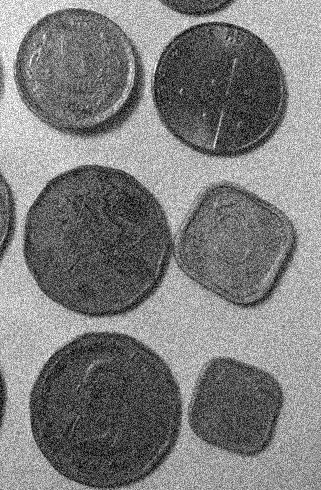

denoised


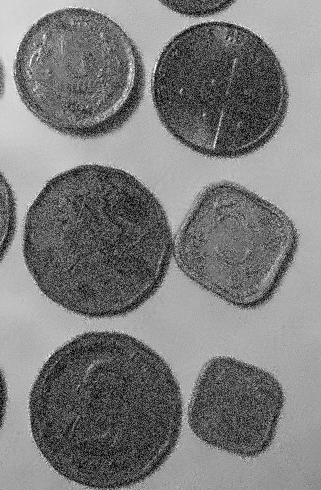

blurred


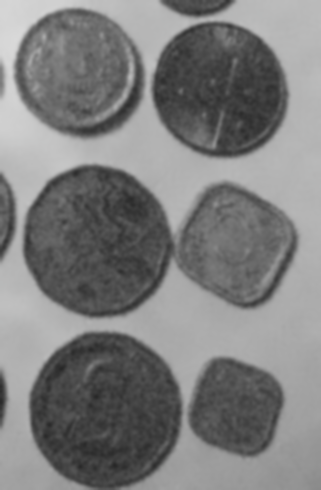

edges


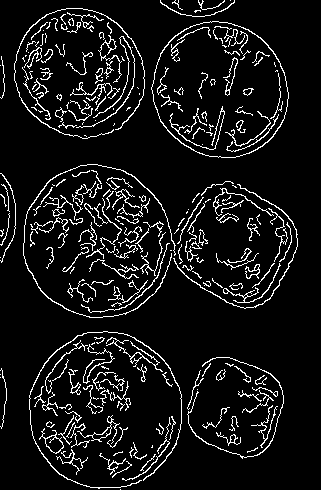

closed edges


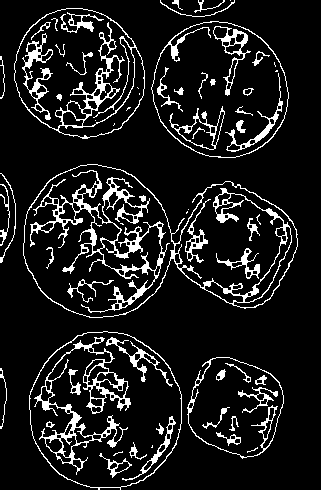

flood fill


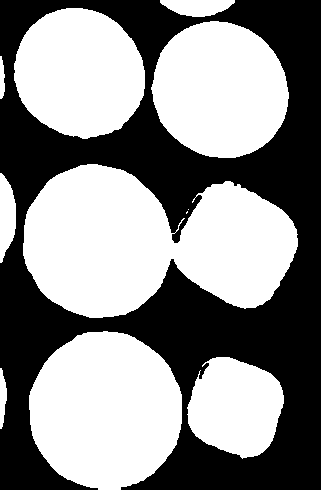

In [9]:
# fast nl denoising
img2_denoise = cv2.fastNlMeansDenoisingColored(monety_szare_szum, None, 10, 10, 7, 21)

# blur
img2_blur = cv2.GaussianBlur(img2_denoise, (9, 9), 0)

# edges with Canny
edges2 = cv2.Canny(image=img2_blur, threshold1=20, threshold2=60)

# close small gaps
kernel = np.ones((3, 3), np.uint8)
edges2_dilated = cv2.dilate(edges2, kernel, iterations=1)
edges2_closed = cv2.erode(edges2_dilated, kernel, iterations=1)

# flood fill edges
img2_out = flood_fill(edges2_closed)

print("original")
display(Image.fromarray(monety_szare_szum))
print("denoised")
display(Image.fromarray(img2_denoise))
print("blurred")
display(Image.fromarray(img2_blur))
print("edges")
display(Image.fromarray(edges2))
print("closed edges")
display(Image.fromarray(edges2_closed))
print("flood fill")
display(Image.fromarray(img2_out))

##### Zad. 2: Monety kolorowe

Na podobnej zasadzie dokonaj binaryzacji poniższych obrazów kolorowych. Skorzystaj z modelu barw HSV. Uzasadnij dobór progu w oparciu o histogram wybranej składowej.

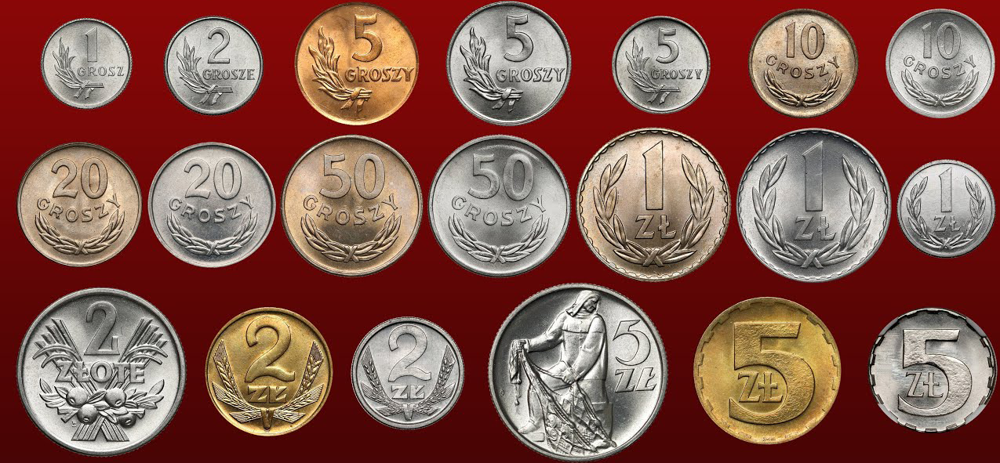

In [10]:
# 2A
monety_kolor = cv2.imread("Monety_kolor.bmp")
Image.fromarray(cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2RGB))

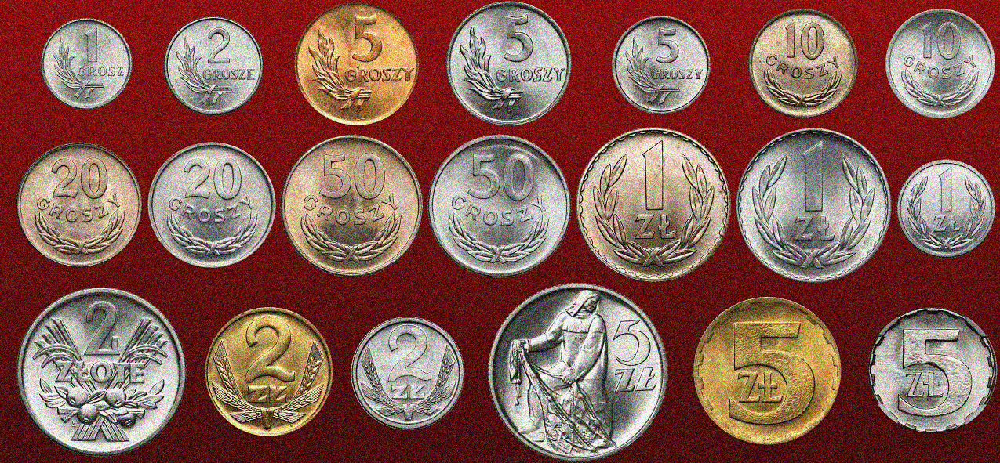

In [11]:
# 2B
monety_kolor_szum = cv2.imread("Monety_kolor_szum.bmp")
Image.fromarray(cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2RGB))

Rozwiązanie części 2A:

hue attribute


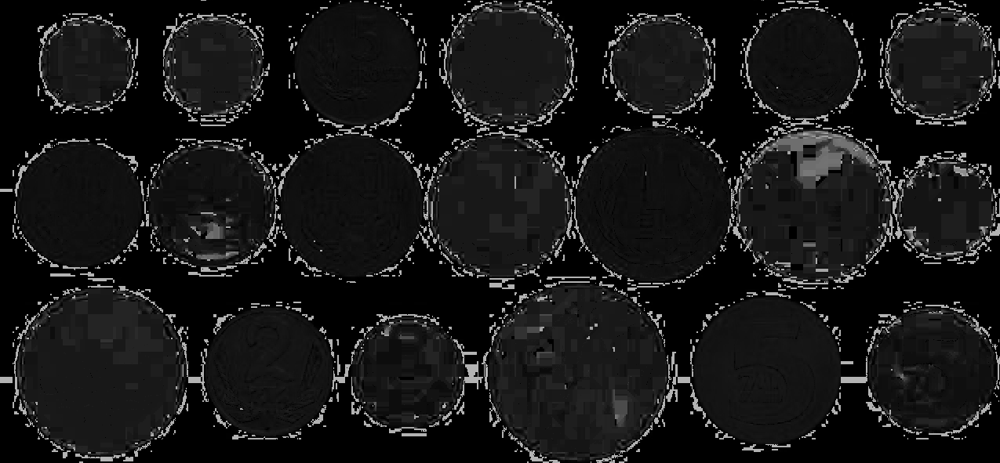

saturation attribute


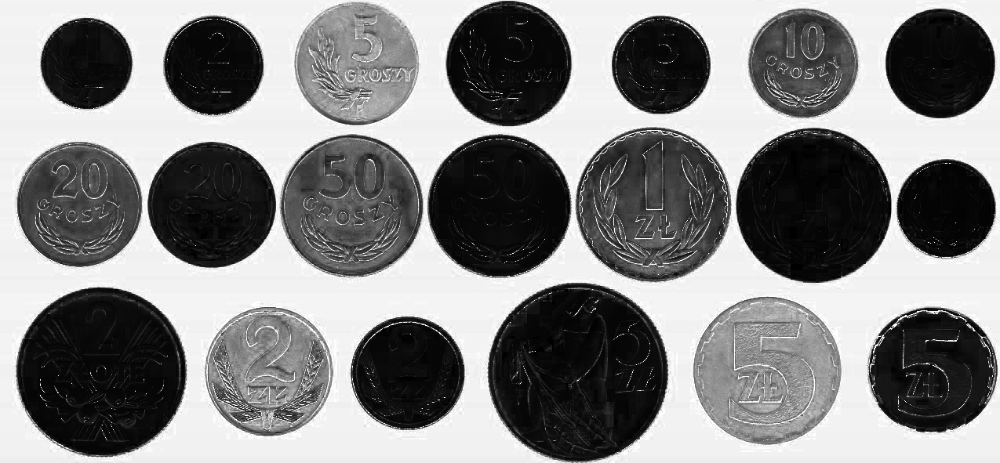

value attribute


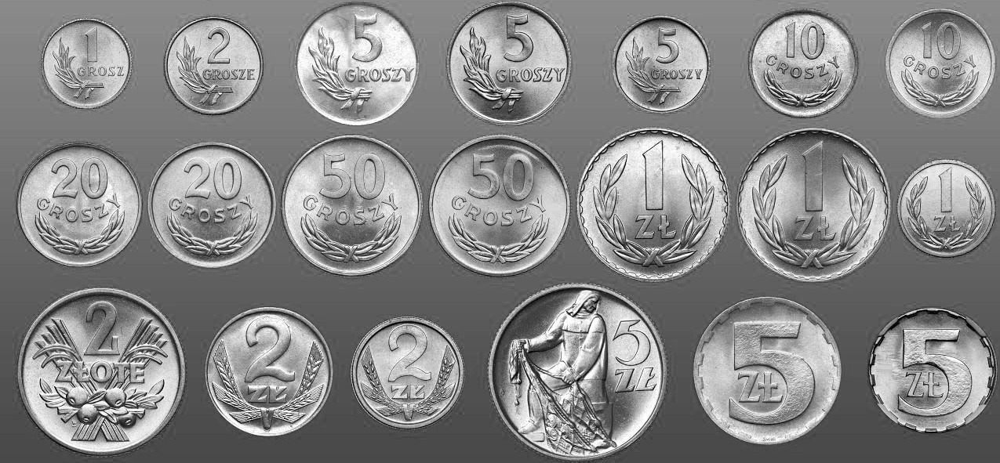

hsv attributes histogram


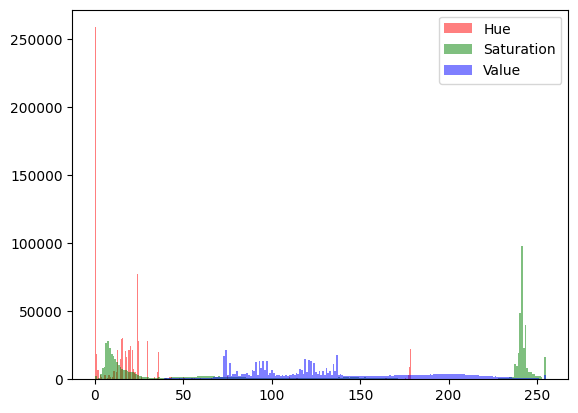

In [12]:
coin_color_hsv = cv2.cvtColor(monety_kolor, cv2.COLOR_BGR2HSV)
coin_color_h, coin_color_s, coin_color_v = cv2.split(coin_color_hsv)
# plot value histogram

print("hue attribute")
display(Image.fromarray(coin_color_h))
print("saturation attribute")
display(Image.fromarray(coin_color_s))
print("value attribute")
display(Image.fromarray(coin_color_v))

print("hsv attributes histogram")
_ = plt.hist(coin_color_h.flatten(), bins=256, color="r", alpha=0.5, label="Hue")
_ = plt.hist(coin_color_s.flatten(), bins=256, color="g", alpha=0.5, label="Saturation")
_ = plt.hist(coin_color_v.flatten(), bins=256, color="b", alpha=0.5, label="Value")
plt.legend()
plt.show()

blur threshold and flood fill


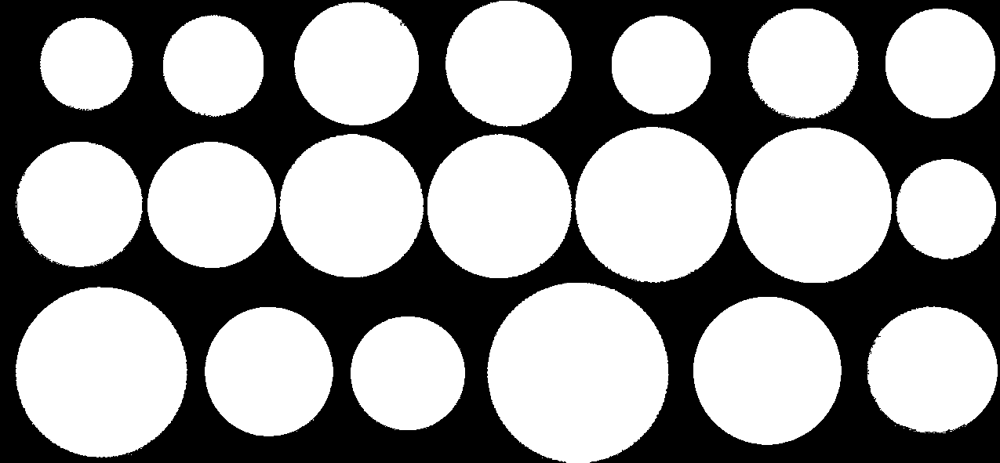

In [13]:
# blur
img3_blur = cv2.GaussianBlur(coin_color_hsv, (9, 9), 0)

# threshold
_, img3_threshInv = cv2.threshold(coin_color_s, 200, 255, cv2.THRESH_BINARY_INV)

# flood fill
im3_out = flood_fill(img3_threshInv)

print("blur threshold and flood fill")
display(Image.fromarray(im3_out))

Rozwiązanie części 2B:


saturation image


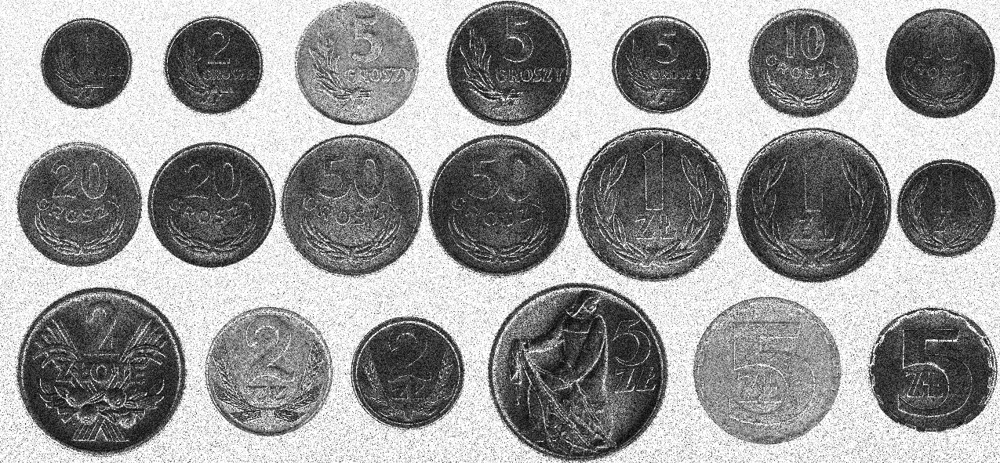

hsv attributes histogram


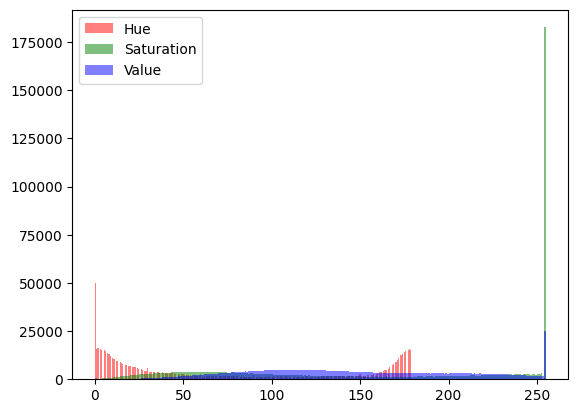

In [14]:
coin_color_noise_hsv = cv2.cvtColor(monety_kolor_szum, cv2.COLOR_BGR2HSV)
coin_color_noise_h, coin_color_noise_s, coin_color_noise_v = cv2.split(
    coin_color_noise_hsv
)
# plot value histogram

print("saturation image")
display(Image.fromarray(coin_color_noise_s))

print("hsv attributes histogram")
_ = plt.hist(coin_color_noise_h.flatten(), bins=256, color="r", alpha=0.5, label="Hue")
_ = plt.hist(
    coin_color_noise_s.flatten(), bins=256, color="g", alpha=0.5, label="Saturation"
)
_ = plt.hist(
    coin_color_noise_v.flatten(), bins=256, color="b", alpha=0.5, label="Value"
)
plt.legend()
plt.show()

res without blur


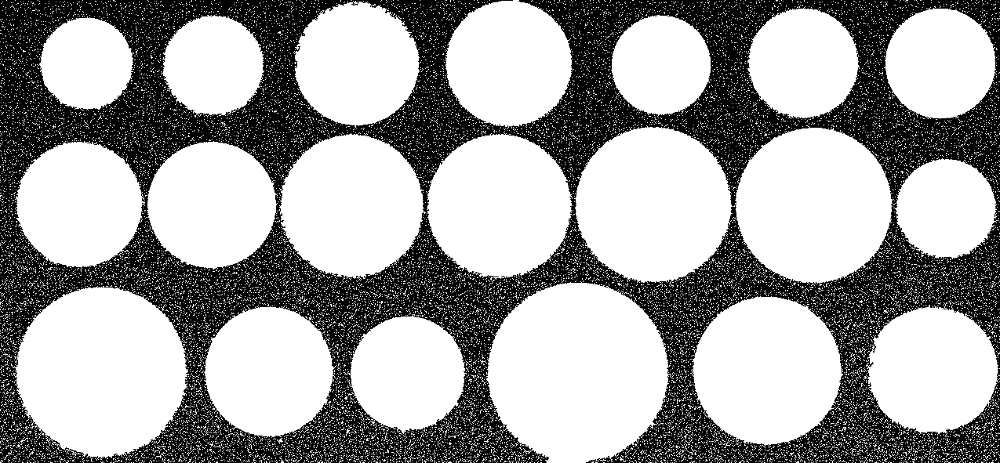

res with blur before threashold and flood fill


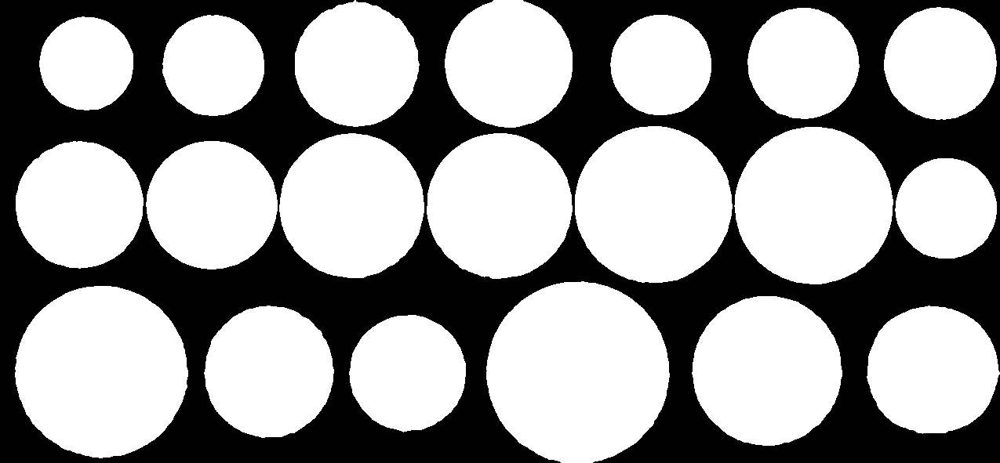

In [15]:
# threshold
_, img4_threshInv = cv2.threshold(coin_color_noise_s, 200, 255, cv2.THRESH_BINARY_INV)

# flood fill
coin_color_noise_out = flood_fill(img4_threshInv)

# again but with blur
coin_color_noise_s_blur = cv2.GaussianBlur(coin_color_noise_s, (13, 13), 0)
_, img5_threshInv = cv2.threshold(
    coin_color_noise_s_blur, 200, 255, cv2.THRESH_BINARY_INV
)
coin_color_noise_out_blur = flood_fill(img5_threshInv)

print("res without blur")
display(Image.fromarray(coin_color_noise_out))
print("res with blur before threashold and flood fill")
display(Image.fromarray(coin_color_noise_out_blur))

##### Zad. 3: Tekst

W tym przypadku należy wyodrębnić litery od bardzo nierównomiernie oświetlonego tła. Skorzystaj z binaryzacji metodą Otsu. Zastosuj binaryzację w sposób lokalny (oknem przesuwnym). Jaki wpływ ma rozmiar okna na jakość binaryzacji? Jak przesuwać okno?

_(Pełna punktacja za zadanie wymaga własnoręcznej implementacji okna przesuwnego i filtracji wewnątrz niego. Użycie zamiast tego_ `cv2.adaptiveThreshold` _liczone jako pół zadania, przy założeniu zrozumienia tej metody.)_

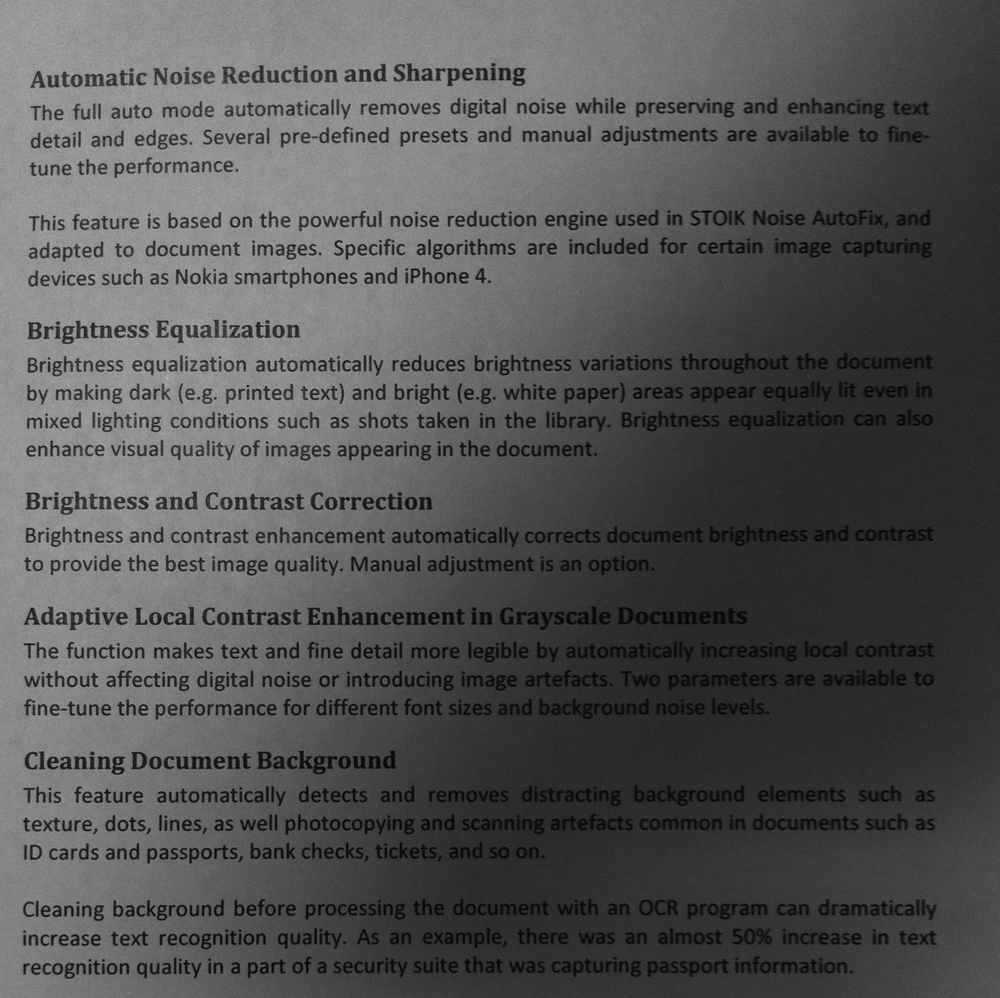

In [16]:
tekst = cv2.imread("Tekst1.bmp")
Image.fromarray(cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY))

Rozwiązanie:

In [17]:
print(tekst.shape)

(1731, 1734, 3)


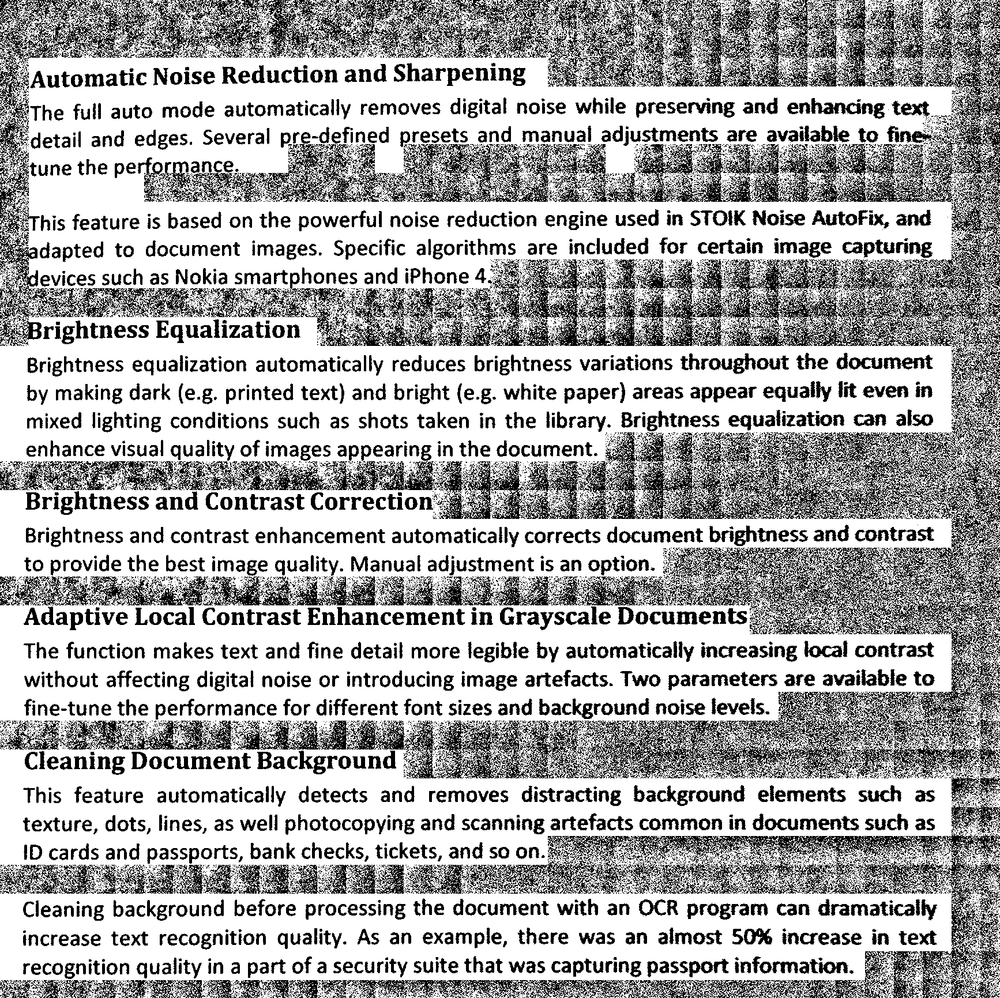

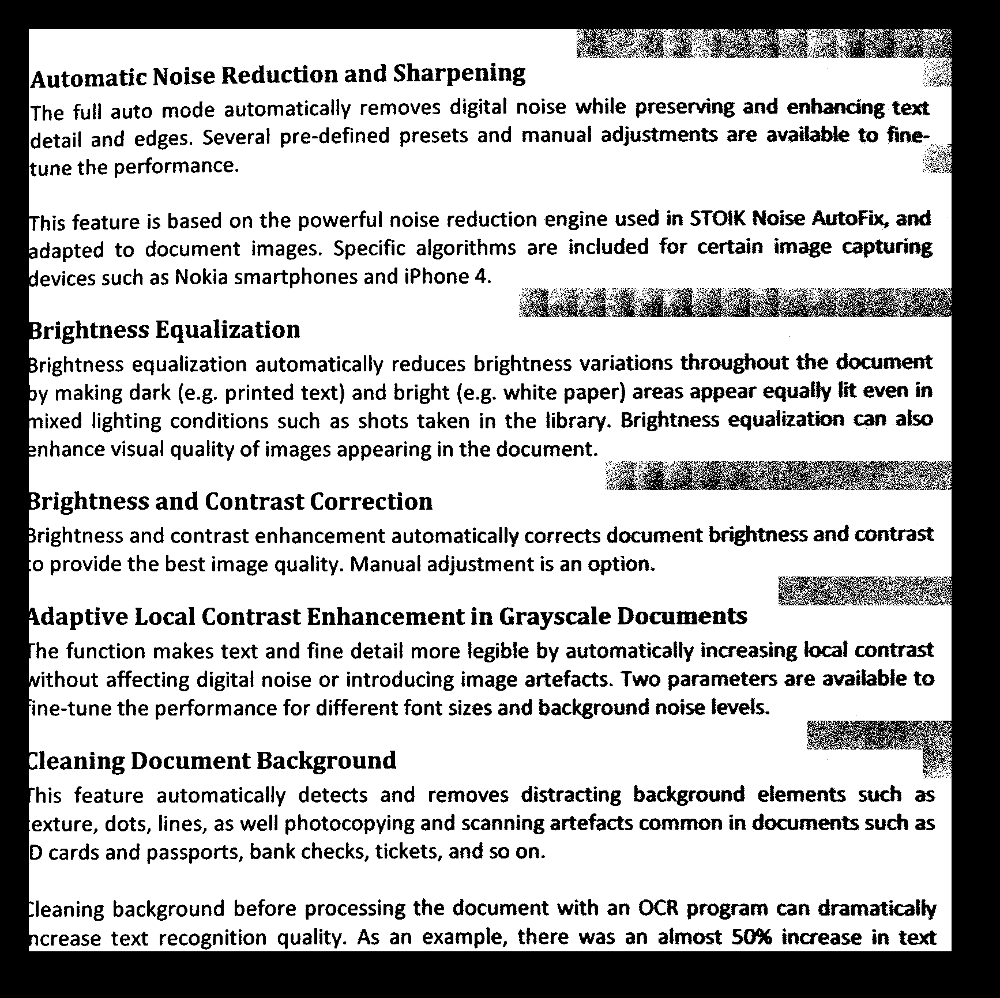

In [51]:
text_gray = cv2.cvtColor(tekst, cv2.COLOR_BGR2GRAY)


def otsu_deez(img: np.ndarray) -> np.ndarray:
    """
    Apply otsu thresholding to image
    """
    ret3, th3 = cv2.threshold(
        img,
        0,
        255,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU,
    )
    return th3


def otsu_rolling_his_window(
    img: np.ndarray, window_size: int, stride: int
) -> np.ndarray:
    """
    Apply otsu thresholding to image with rolling window
    """

    res = np.zeros_like(img)
    for x in range(0, img.shape[0], stride):
        for y in range(0, img.shape[1], stride):
            window = img[x : x + window_size, y : y + window_size]

            # if a window has low contrast we will just fill it with white
            # insufficient_contrast = np.std(window.flatten()) < 10
            # if insufficient_contrast:
            # th3 = np.full_like(window, 255)
            # else:
            # else apply otsu thresholding
            th3 = otsu_deez(window)

            res[x : x + window_size, y : y + window_size] = th3
    return res


def sliding_window_with_a_brim(
    img: np.ndarray,
    window_size: int,
    brim_size: int,
):

    res = np.zeros_like(img)
    for x in range(brim_size, img.shape[0], window_size):
        for y in range(brim_size, img.shape[1], window_size):
            # get outsu thresholding for outer window
            outer_window = img[
                x - brim_size : x + window_size + brim_size,
                y - brim_size : y + window_size + brim_size,
            ]
            th3 = otsu_deez(outer_window)

            # if window is not the right size skip for now
            # TODO: handle this
            if th3.shape != (window_size + 2 * brim_size, window_size + 2 * brim_size):
                continue

            # apply thresholding to inner window
            res[x : x + window_size, y : y + window_size] = th3[
                brim_size:-brim_size, brim_size:-brim_size
            ]
    return res


text_gray_res = otsu_rolling_his_window(text_gray, 50, 50)

text_gray_res_3 = sliding_window_with_a_brim(text_gray, 50, 50)

display(Image.fromarray(text_gray_res))
# display(Image.fromarray(text_gray_res_2))
display(Image.fromarray(text_gray_res_3))